### Importing Libraries

In [175]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import math
from mpl_toolkits.mplot3d import Axes3D
import random

### Setting up seed

In [176]:
random.seed(3116)

### Utilities functions for logistic regression

In [177]:
def _sigmoid(z):
    return 1 / (1 + np.exp(-z))

In [178]:
def y_prediction(X_data, beta):
    beta = np.dot(X_data, beta)
    y_predict = _sigmoid(beta)
    return y_predict

In [179]:
def logloss_function_new(X_data, Y_data, beta,fg): 
    y_hat = y_prediction(X_data, beta)
    if fg==1:
        l = (Y_data * np.log(y_hat)) + ((1-Y_data)*np.log(1-y_hat))

    else:   
        l = (Y_data.T * np.log(y_hat)) + ((1-Y_data.T)*np.log(1-y_hat))
    l = sum(l) 
    l= -1*l
    return l

In [180]:
def Logistic_Regression_new(X_data, Y_data, X_test, Y_test, nBatches, lr, lamda,fg=0):
    betas = np.zeros((X_data.shape[1], 1)) 
    history = np.zeros((X_data.shape[1], 1)) 
    listErrors = [] 
    listTestAccr = [] 
    listTrainAccr = []
    listTestloss = [] 
    listTrainloss = []
    single_train_loss = []
    single_test_loss = []
    
    
    for k in range(10): 
        oldLoss = logloss_function_new(X_data, Y_data, betas,fg)
        
        for s in range(math.ceil(len(X_data)/nBatches)): 
            y_hat = y_prediction(X_data[s*nBatches:(s+1)*nBatches],betas)
            
            betas = (1 - 2*lr*lamda)*betas - lr * (-2 * np.dot(X_data[s*nBatches:(s+1)*nBatches].T,
                                                               Y_data.T[s*nBatches:(s+1)*nBatches]-y_hat))
        
        #Finding accuracies on test and train sets
        
        y_hat_train = y_prediction(X_data,betas)
        predicted_labels_train = [1 if x >= .5 else 0 for x in y_hat_train]
        no_true = np.count_nonzero(predicted_labels_train == Y_data)
        no_false = Y_data.shape[1] - no_true
        train_accuracy = no_true/(no_true + no_false)
                
        y_hat_test = y_prediction(X_test,betas)
        predicted_labels = [1 if x >= .5 else 0 for x in y_hat_test]
        no_true = np.count_nonzero(predicted_labels == Y_test)
        no_false = Y_test.shape[1] - no_true
        test_accuracy = no_true/(no_true + no_false)
        
            
        newLoss = logloss_function_new(X_data, Y_data, betas,fg)
        
        listTrainAccr.append(train_accuracy) 
        listTestAccr.append(test_accuracy)
        
        listTrainloss.append(logloss_function_new(X_data, Y_data, betas,fg)) 
        listTestloss.append(logloss_function_new(X_test, Y_test, betas,fg))
        
        if fg==1:
            single_train_loss.append(np.ravel(logloss_function_new(X_data, Y_data, betas,fg))) 
            single_test_loss.append(np.ravel(logloss_function_new(X_test, Y_test, betas,fg)))
        
        if np.abs(newLoss - oldLoss) < 0.00000001: 
            break
            
    result_string_train = 'Train Accuracy with ' + 'alpha=' + str(lr) + ' lamda=' + str(lamda)
    result_string_test = 'Test Accuracy with ' + 'alpha=' + str(lr) + ' lamda=' + str(lamda)
    
    result_string_train_loss = 'Train loglikelihood with ' + 'alpha=' + str(lr) + ' lamda=' + str(lamda)
    result_string_test_loss = 'Test loglikelihood with ' + 'alpha=' + str(lr) + ' lamda=' + str(lamda)

    plt.figure(figsize=(25,5), dpi=120)
    plt.subplot(1,4,1)
    plt.plot(listTrainAccr) 
    plt.xlabel('Iteration') 
    plt.ylabel('Accuracy') 
    plt.title(result_string_train)

    plt.subplot(1,4,2)
    plt.plot(listTestAccr) 
    plt.xlabel('Iteration') 
    plt.ylabel('Accuracy') 
    plt.title(result_string_test)
    
    if fg==1:
        plt.subplot(1,4,3)
        plt.plot(single_train_loss) 
        plt.xlabel('Iteration') 
        plt.ylabel('loglikelihood') 
        plt.title(result_string_train_loss)

        plt.subplot(1,4,4)
        plt.plot(single_test_loss) 
        plt.xlabel('Iteration') 
        plt.ylabel('loglikelihood') 
        plt.title(result_string_test_loss)
        
    else:
        
        plt.subplot(1,4,3)
        plt.plot(listTrainloss) 
        plt.xlabel('Iteration') 
        plt.ylabel('loglikelihood') 
        plt.title(result_string_train_loss)

        plt.subplot(1,4,4)
        plt.plot(listTestloss) 
        plt.xlabel('Iteration') 
        plt.ylabel('loglikelihood') 
        plt.title(result_string_test_loss)
    
        
    return listTrainAccr, listTestAccr, listTrainloss, listTestloss

### Functions for  k-folds cross validation

In [181]:
def cross_validation_split(X_data, Y_data, folds=3): 
    dataset_split = list() 
    datasetX_copy = np.copy(X_data) 
    datasetY_copy = np.copy(Y_data) 
    fold_size = math.ceil(len(X_data) / folds) 
    for i in range(folds): 
        if (i < folds-1): 
            dataset_split.append((datasetX_copy[i*fold_size:(i+1)*fold_size], \
                                  datasetY_copy.T[i*fold_size:(i+1)*fold_size]))
        else: 
            dataset_split.append((datasetX_copy[i*fold_size:len(X_data)], \
                                  datasetY_copy.T[i*fold_size:len(X_data)]))
    return dataset_split

In [182]:
def k_Fold(X_data, Y_data, lr, lamda, k, prob, epochs, batchsize=50):
    folds = cross_validation_split(X_data, Y_data, k)
    listCVE = []
    listLs = []
    for s in range(len(folds)):
        trainX = np.vstack([x[0] for x in folds if x is not folds[s]]) 
        trainY = np.vstack([x[1] for x in folds if x is not folds[s]]) 
        trainY = trainY.T
        validX = folds[s][0] 
        validY = folds[s][1]
        validY = validY.T
        listTrainAccr, listTestAccr,listTrainLoss, listTestLoss = Logistic_Regression_new(trainX, trainY, validX, validY, batchsize, lr,lamda)
            
        listCVE.append(listTestAccr[-1])
        listLs.append(listTestLoss[-1])
    
    return np.mean(listCVE),np.mean(listLs)


### Function to split dataset into train,test  set as mentioned in exercise along with normalization

In [183]:
def split(df,targetcol):
    X = df.drop(targetcol,axis=1)
    Y = df[targetcol]  
    X_copy = X.copy()
    Xtrain = X_copy.sample(frac=0.80, random_state=0)
    Xtest = X_copy.drop(Xtrain.index)
    norm_Xtrain = np.linalg.norm(Xtrain, axis = 1, keepdims = True)
    Xtrain = Xtrain / norm_Xtrain
    norm_Xtest = np.linalg.norm(Xtest, axis = 1, keepdims = True)
    Xtest = Xtest / norm_Xtest    
    Y_copy = Y.copy()
    Ytrain = Y_copy.sample(frac=0.80, random_state=0)
    Ytest = Y_copy.drop(Ytrain.index)
    Ytrain = np.matrix(Ytrain)
    Ytest = np.matrix(Ytest)
    return Xtrain, Ytrain, Xtest, Ytest

### Loading dataset

In [184]:
data1 = pd.read_csv('bank.csv', delimiter= ';', header=0)

data1 = data1.drop('duration', axis = 1) # dropping coloumn of duration because in exercise 1 backward selection, removing this coloumn gave us minimum aic metric.

data1['y'] = data1['y'].map({'yes': 1, 'no': 0}) #changing label to numeric 

data1 = pd.get_dummies(data1)

data1.insert(loc=0,column='bias',value=np.ones(len(data1))) #inserting bias to dataset

In [185]:
Xtrain, Ytrain, Xtest, Ytest = split(data1,"y")

In [186]:
print (Xtrain.shape)
print (Xtest.shape)
print (Ytrain.shape)
print (Ytest.shape)

(3617, 51)
(904, 51)
(1, 3617)
(1, 904)


#### Running  k-fold cross-validation protocol for grid search. For each combination of α0 and λ  we perform k-fold cross-validation and plotted train and validation accuracy and log-likelihood metrics per k − fold iteration

C:\Users\fahad\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


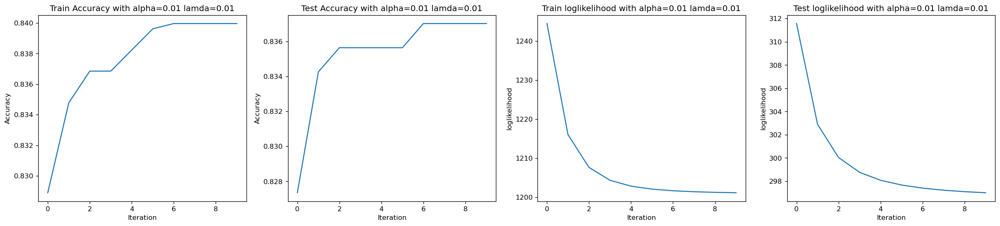

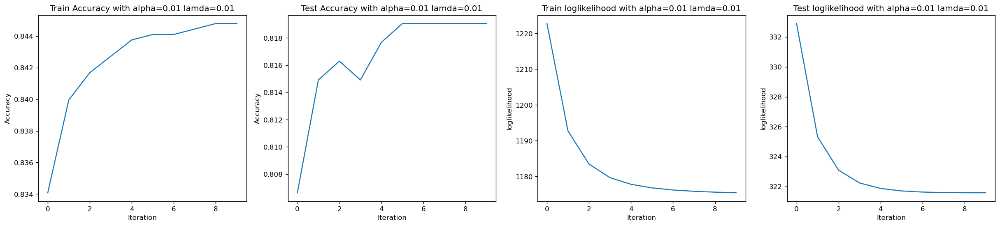

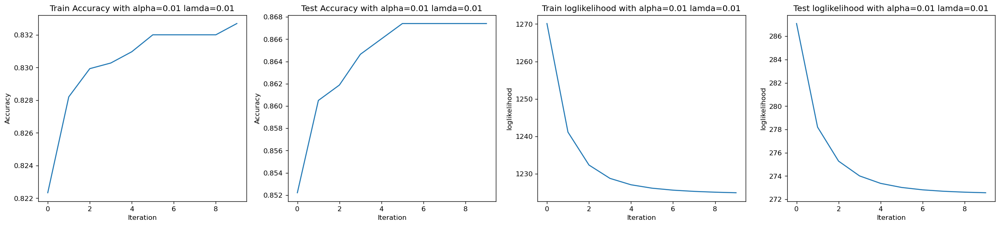

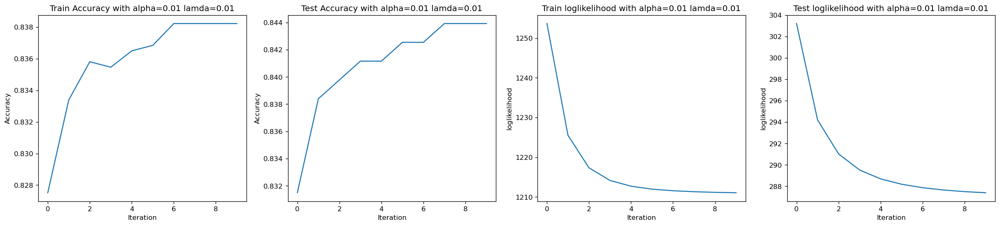

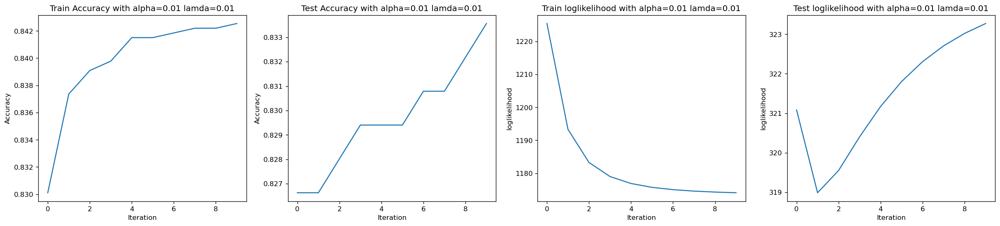

...

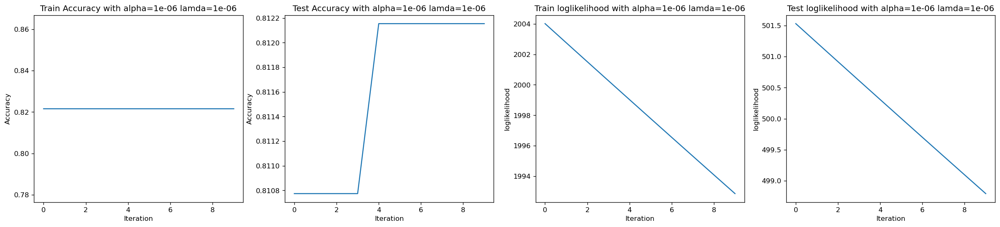

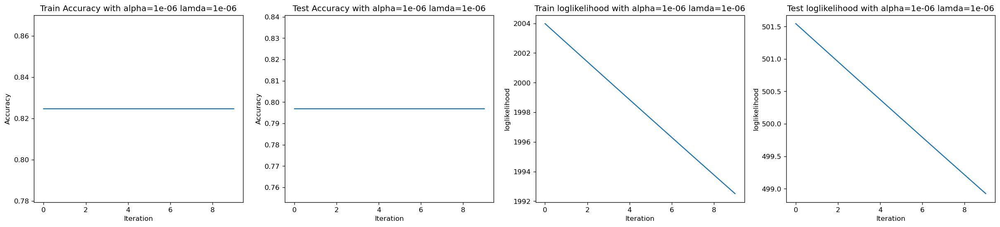

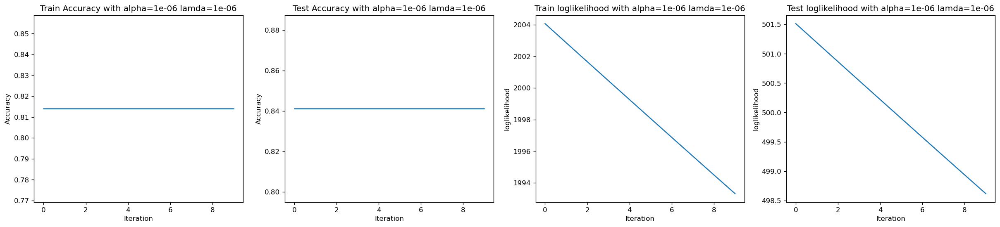

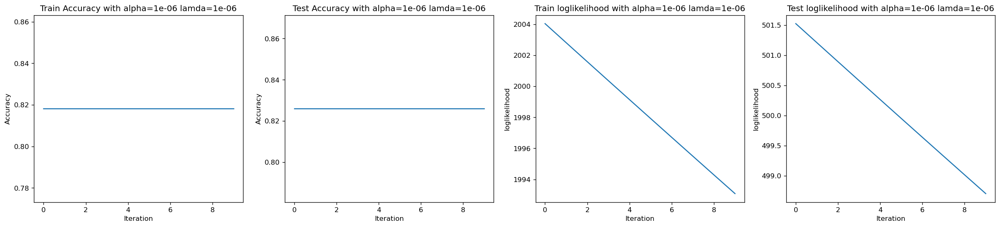

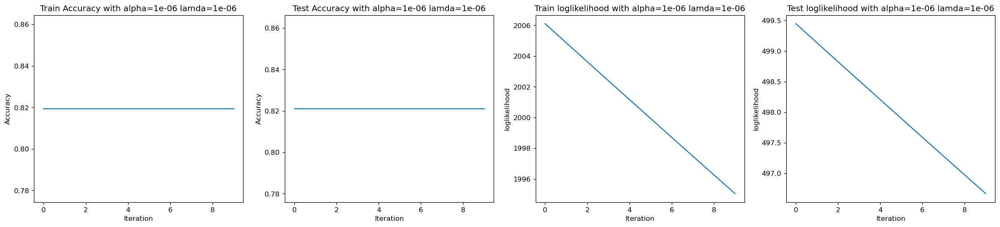

In [187]:
listAlpha = [0.01,0.001,0.0001,0.00001,0.000001] 
listLamda = [0.01,0.001,0.0001,0.00001,0.000001]

listAccr = np.zeros((5,5))
listLoss = np.zeros((5,5)) 
for i, alpha in enumerate(listAlpha): 
    for j, lamda in enumerate(listLamda): 
        listAccr[i, j], listLoss[i, j] = k_Fold(Xtrain, Ytrain, alpha, lamda, 5, 1, 100, 50)

### The values of 𝛼 and λ for which the loss is minimum are recorded. In this case (k=5), the following results are obtained:

In [188]:
indx = np.unravel_index(np.nanargmax(listLoss), listLoss.shape) 
print("Best hyperparameters: Alpha", listAlpha[indx[0]], "Lamda", listLamda[indx[1]])

Best hyperparameters: Alpha 1e-06 Lamda 0.01


### 3-D Plot For Loss

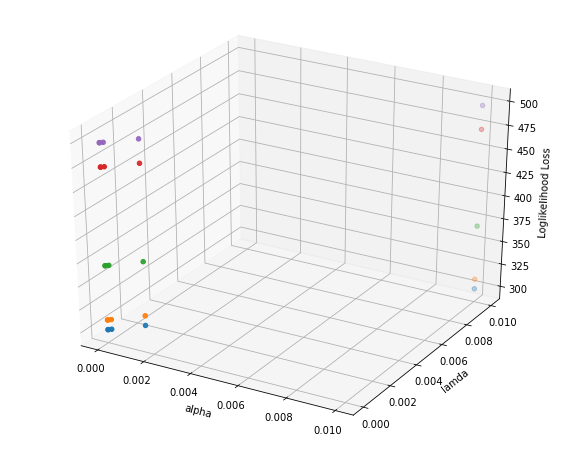

In [189]:
fig = plt.figure(figsize = (10, 8))
ax = fig.add_subplot(111, projection='3d')
for i in range(len(listAlpha)):
    ax.scatter(listAlpha, listLamda, listLoss[i])
    ax.set_xlabel('alpha')
    ax.set_ylabel('lamda')
    ax.set_zlabel('Loglikelihood Loss')
plt.show()

### 3-D Plot For Mean Accuracies

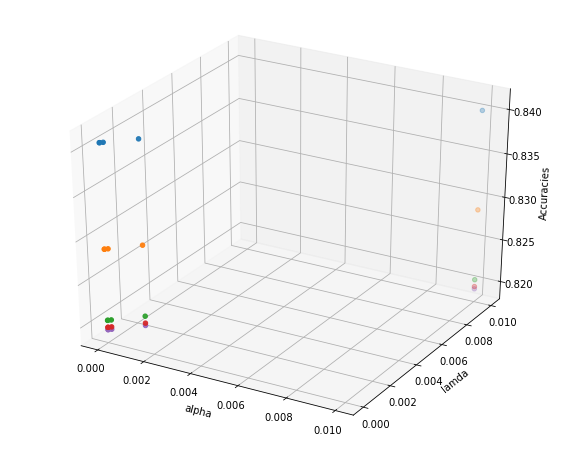

In [190]:
fig = plt.figure(figsize = (10, 8))
ax = fig.add_subplot(111, projection='3d')
for i in range(len(listAlpha)):
    ax.scatter(listAlpha, listLamda, listAccr[i])
    ax.set_xlabel('alpha')
    ax.set_ylabel('lamda')
    ax.set_zlabel('Accuracies')
plt.show()

#### Model retraining  with values of 𝛼 and λ for which the minimum loss was obtained. Also results are plotted as well

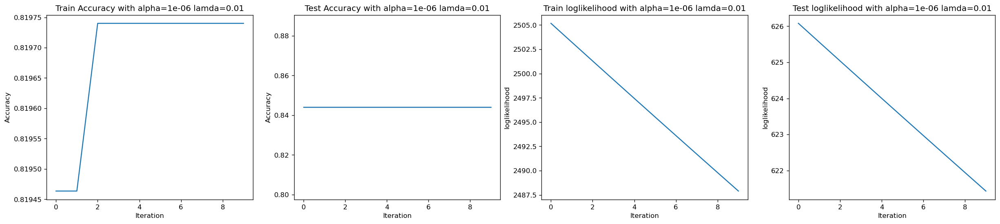

In [191]:
tr_a, te_a, tr_l, te_l = Logistic_Regression_new(Xtrain, Ytrain, Xtest, Ytest, 50, 1e-06, 0.01,1)

### Test Loss

In [192]:
np.array(te_l[-1])[0][0]

621.4312478052794

### Test Accuracy

In [193]:
te_a[-1]

0.8440265486725663